### Imports and Data
I got the data from https://github.com/tonmcg/County_Level_Election_Results_12-16, a fantastic resource.

In [1]:
import numpy as np
import pandas as pd
# Plotting
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import altair as alt

In [2]:
# Import the main data.
df08 = pd.read_csv('data/US_County_Level_Presidential_Results_08-16.csv')
# I can't figure out what the use of this second CSV is...
# importing it just in case so I have the code.
df12 = pd.read_csv('data/US_County_Level_Presidential_Results_12-16.csv', index_col=0)

### Vote Share Distribution

Add columns for Democratic share of the vote (dem_share) and Republican share (gop_share).

In [3]:
df08['dem_share_2016'] = df08['dem_2016'] / df08['total_2016']
df08['gop_share_2016'] = df08['gop_2016'] / df08['total_2016']
df08['dem_share_2012'] = df08['dem_2012'] / df08['total_2012']
df08['gop_share_2012'] = df08['gop_2012'] / df08['total_2012']
df08['dem_share_2008'] = df08['dem_2008'] / df08['total_2008']
df08['gop_share_2008'] = df08['gop_2008'] / df08['total_2008']

Any rows that have a dem_share or gop_share over 1 should be dropped as invalid.

In [4]:
filtered_cols = ['dem_share_2016', 'gop_share_2016',
                 'dem_share_2012', 'gop_share_2012',
                 'dem_share_2008', 'gop_share_2008']
is_invalid_filter = (df08[filtered_cols] > 1).any(axis=1)
n_rows_to_drop = is_invalid_filter[is_invalid_filter].shape[0]
print('Dropping {} row(s) as invalid.'.format(n_rows_to_drop))
df08 = df08[~is_invalid_filter]
df08.shape[0]

Dropping 1 row(s) as invalid.


3111

Plot density plots of vote share for each party.

/anaconda3/envs/ad_hoc/lib/python3.6/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


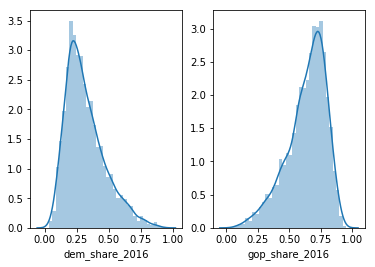

In [5]:
fig, ax = plt.subplots(ncols=2)
sns.distplot(df08['dem_share_2016'], ax=ax[0])
sns.distplot(df08['gop_share_2016'], ax=ax[1])

### Compare county size (using n_votes as a proxy) to winner

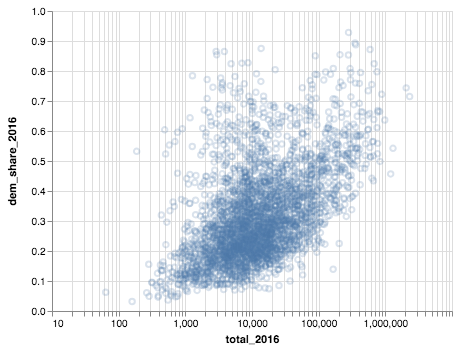

In [6]:
alt.Chart(df08).mark_point(strokeOpacity=.3).encode(
    x=alt.X('total_2016',
            scale=alt.Scale(type='log')),
    y='dem_share_2016'
)

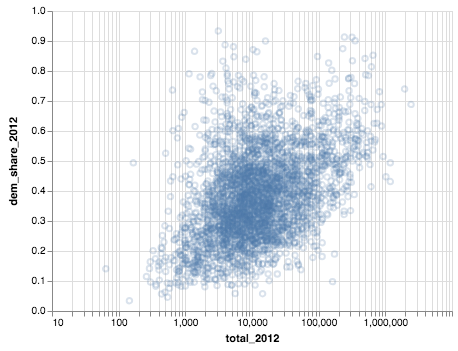

In [7]:
alt.Chart(df08).mark_point(strokeOpacity=.3).encode(
    x=alt.X('total_2012',
            scale=alt.Scale(type='log')),
    y='dem_share_2012'
)

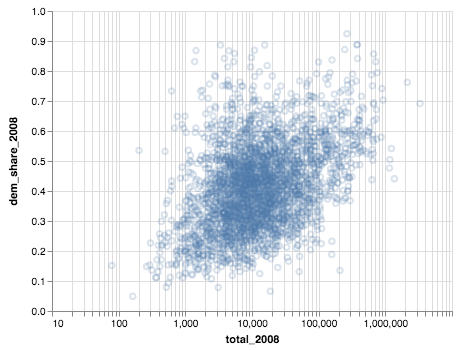

In [8]:
alt.Chart(df08).mark_point(strokeOpacity=.3).encode(
    x=alt.X('total_2008',
            scale=alt.Scale(type='log')),
    y='dem_share_2008'
)

### Combine these all into one chart
Reshape the data and plot again.

First, we melt and separate year as its own variable.

In [9]:
melted = df08.melt(id_vars=['fips_code', 'county'])
# Split the variable name (e.g. dem_share_2008) into two columns, measure_name and year
new_cols = pd.DataFrame(melted['variable'].str.rsplit('_', 1).tolist(), columns=['measure_name', 'year'])
# Merge the new columns in and drop the 'variable' column
reshaped = pd.concat([melted, new_cols], axis=1).drop('variable', axis=1)
reshaped.head()

,fips_code,county,value,measure_name,year
0,26041,Delta County,19064.0,total,2008
1,48295,Lipscomb County,1256.0,total,2008
2,1127,Walker County,28652.0,total,2008
3,48389,Reeves County,3077.0,total,2008
4,56017,Hot Springs County,2546.0,total,2008


We have fully melted data here, but we need dem, gop, and total to all be in the same row in order to plot them against each other -- so we unm
Then we unmelt, so total, dem_share, and gop_share are all in the same row.

In [10]:
data = reshaped.pivot_table(index=['fips_code', 'county', 'year'], columns=['measure_name'])
data.head()

value                                      \
measure_name                       dem dem_share      gop gop_share    oth   
fips_code county         year                                                
1001      Autauga County 2008   6093.0  0.257730  17403.0  0.736136  145.0   
                         2012   6354.0  0.265758  17366.0  0.726337  189.0   
                         2016   5908.0  0.239569  18110.0  0.734358  643.0   
1003      Baldwin County 2008  19386.0  0.238119  61271.0  0.752595  756.0   
                         2012  18329.0  0.215666  65772.0  0.773897  887.0   

                                        
measure_name                     total  
fips_code county         year           
1001      Autauga County 2008  23641.0  
                         2012  23909.0  
                         2016  24661.0  
1003      Baldwin County 2008  81413.0  
                         2012  84988.0

Last, we need to convert the index into regular columns because Altair doesn't like hierarchical indices.

In [11]:
flattened = data.copy()
flattened.columns = flattened.columns.get_level_values(1)
flattened = pd.DataFrame(flattened.to_records())

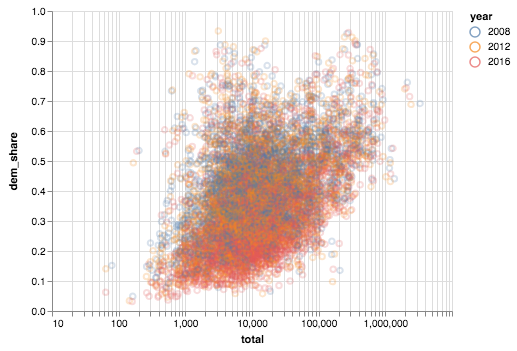

In [12]:
# Increase Altair's default maximum rows in a dataset.
alt.data_transformers.enable('default', max_rows=1000000)
alt.Chart(flattened).mark_point(strokeOpacity=.3).encode(
    x=alt.X('total',
            scale=alt.Scale(type='log')),
    y='dem_share',
    color='year:N')

### Add a "winner" and "dem_margin" columns
One last thing that I think will be nice to have is a column for the winner of each election and a column for the margin of victory/defeat by party.

In [13]:
def choose_winner(row):
    '''Return the winning party (dem, gop, other) given a row of input.'''
    if row['oth'] > row['dem'] and row['oth'] > row['gop']:
        return 'oth'
    elif row['dem'] >= row['oth'] and row['dem'] >= row['gop']:
        return 'dem'
    elif row['gop'] >= row['oth'] and row['gop'] >= row['dem']:
        return 'gop'
    else:
        return 'tie'
flattened['winner'] = flattened.apply(choose_winner, axis=1)
flattened['dem_margin'] = flattened['dem_share'] - flattened['gop_share']
flattened.head()

,fips_code,county,year,dem,dem_share,gop,gop_share,oth,total,winner,dem_margin
0,1001,Autauga County,2008,6093.0,0.257730,17403.0,0.736136,145.0,23641.0,gop,-0.478406
1,1001,Autauga County,2012,6354.0,0.265758,17366.0,0.726337,189.0,23909.0,gop,-0.460580
2,1001,Autauga County,2016,5908.0,0.239569,18110.0,0.734358,643.0,24661.0,gop,-0.494789
3,1003,Baldwin County,2008,19386.0,0.238119,61271.0,0.752595,756.0,81413.0,gop,-0.514476
4,1003,Baldwin County,2012,18329.0,0.215666,65772.0,0.773897,887.0,84988.0,gop,-0.558232


### Save this nicer data

I like this new form of the data much better, so I'm going to save it and use it as a starting point for anything else I do.

In [14]:
flattened.to_csv('data/nice_election_data_2008_to_2016.csv', index=False)

In [15]:
pd.read_csv('data/nice_election_data_2008_to_2016.csv').head()

,fips_code,county,year,dem,dem_share,gop,gop_share,oth,total,winner,dem_margin
0,1001,Autauga County,2008,6093.0,0.257730,17403.0,0.736136,145.0,23641.0,gop,-0.478406
1,1001,Autauga County,2012,6354.0,0.265758,17366.0,0.726337,189.0,23909.0,gop,-0.460580
2,1001,Autauga County,2016,5908.0,0.239569,18110.0,0.734358,643.0,24661.0,gop,-0.494789
3,1003,Baldwin County,2008,19386.0,0.238119,61271.0,0.752595,756.0,81413.0,gop,-0.514476
4,1003,Baldwin County,2012,18329.0,0.215666,65772.0,0.773897,887.0,84988.0,gop,-0.558232
